# Your First GAN

### Goal
In this notebook, you're going to create your first generative adversarial network (GAN) for this course! Specifically, you will build and train a GAN that can generate hand-written images of digits (0-9). You will be using PyTorch in this specialization, so if you're not familiar with this framework, you may find the [PyTorch documentation](https://pytorch.org/docs/stable/index.html) useful. The hints will also often include links to relevant documentation.

### Learning Objectives
1.   Build the generator and discriminator components of a GAN from scratch.
2.   Create generator and discriminator loss functions.
3.   Train your GAN and visualize the generated images.


## Getting Started
You will begin by importing some useful packages and the dataset you will use to build and train your GAN. You are also provided with a visualizer function to help you investigate the images your GAN will create.


In [1]:
import torch
from torch import nn
from tqdm.auto import tqdm
from torchvision import transforms
from torchvision.datasets import MNIST # Training dataset
from torchvision.utils import make_grid
from torch.utils.data import DataLoader
import matplotlib.pyplot as plt
torch.manual_seed(0) # Set for testing purposes, please do not change!

def show_tensor_images(image_tensor, num_images=25, size=(1, 28, 28)):
    '''
    Function for visualizing images: Given a tensor of images, number of images, and
    size per image, plots and prints the images in a uniform grid.
    '''
    image_unflat = image_tensor.detach().cpu().view(-1, *size)
    image_grid = make_grid(image_unflat[:num_images], nrow=5)
    plt.imshow(image_grid.permute(1, 2, 0).squeeze())
    plt.show()

#### MNIST Dataset
The training images your discriminator will be using is from a dataset called [MNIST](http://yann.lecun.com/exdb/mnist/). It contains 60,000 images of handwritten digits, from 0 to 9, like these:

![MNIST Digits](MnistExamples.png)

You may notice that the images are quite pixelated -- this is because they are all only 28 x 28! The small size of its images makes MNIST ideal for simple training. Additionally, these images are also in black-and-white so only one dimension, or "color channel", is needed to represent them (more on this later in the course).

#### Tensor
You will represent the data using [tensors](https://pytorch.org/docs/stable/tensors.html). Tensors are a generalization of matrices: for example, a stack of three matrices with the amounts of red, green, and blue at different locations in a 64 x 64 pixel image is a tensor with the shape 3 x 64 x 64.

Tensors are easy to manipulate and supported by [PyTorch](https://pytorch.org/), the machine learning library you will be using. Feel free to explore them more, but you can imagine these as multi-dimensional matrices or vectors!

#### Batches
While you could train your model after generating one image, it is extremely inefficient and leads to less stable training. In GANs, and in machine learning in general, you will process multiple images per training step. These are called batches.

This means that your generator will generate an entire batch of images and receive the discriminator's feedback on each before updating the model. The same goes for the discriminator, it will calculate its loss on the entire batch of generated images as well as on the reals before the model is updated.

## Generator
The first step is to build the generator component.

You will start by creating a function to make a single layer/block for the generator's neural network. Each block should include a [linear transformation](https://pytorch.org/docs/stable/generated/torch.nn.Linear.html) to map to another shape, a [batch normalization](https://pytorch.org/docs/stable/generated/torch.nn.BatchNorm1d.html) for stabilization, and finally a non-linear activation function (you use a [ReLU here](https://pytorch.org/docs/master/generated/torch.nn.ReLU.html)) so the output can be transformed in complex ways. You will learn more about activations and batch normalization later in the course.

In [2]:
# UNQ_C1 (UNIQUE CELL IDENTIFIER, DO NOT EDIT)
# GRADED FUNCTION: get_generator_block
def get_generator_block(input_dim, output_dim):
    '''
    Function for returning a block of the generator's neural network
    given input and output dimensions.
    Parameters:
        input_dim: the dimension of the input vector, a scalar
        output_dim: the dimension of the output vector, a scalar
    Returns:
        a generator neural network layer, with a linear transformation 
          followed by a batch normalization and then a relu activation
    '''
    return nn.Sequential(
        # Hint: Replace all of the "None" with the appropriate dimensions.
        # The documentation may be useful if you're less familiar with PyTorch:
        # https://pytorch.org/docs/stable/nn.html.
        #### START CODE HERE ####
        nn.Linear(input_dim, output_dim),
        nn.BatchNorm1d(output_dim),
        nn.ReLU(inplace=True),
        #### END CODE HERE ####
    )

In [3]:
# Verify the generator block function
def test_gen_block(in_features, out_features, num_test=1000):
    block = get_generator_block(in_features, out_features)

    # Check the three parts
    assert len(block) == 3
    assert type(block[0]) == nn.Linear
    assert type(block[1]) == nn.BatchNorm1d
    assert type(block[2]) == nn.ReLU
    
    # Check the output shape
    test_input = torch.randn(num_test, in_features)
    test_output = block(test_input)
    assert tuple(test_output.shape) == (num_test, out_features)
    assert test_output.std() > 0.55
    assert test_output.std() < 0.65

test_gen_block(25, 12)
test_gen_block(15, 28)
print("Success!")

Success!


Now you can build the generator class. It will take 3 values:

*   The noise vector dimension
*   The image dimension
*   The initial hidden dimension

Using these values, the generator will build a neural network with 5 layers/blocks. Beginning with the noise vector, the generator will apply non-linear transformations via the block function until the tensor is mapped to the size of the image to be outputted (the same size as the real images from MNIST). You will need to fill in the code for final layer since it is different than the others. The final layer does not need a normalization or activation function, but does need to be scaled with a [sigmoid function](https://pytorch.org/docs/master/generated/torch.nn.Sigmoid.html). 

Finally, you are given a forward pass function that takes in a noise vector and generates an image of the output dimension using your neural network.

<details>

<summary>
<font size="3" color="green">
<b>Optional hints for <code><font size="4">Generator</font></code></b>
</font>
</summary>

1. The output size of the final linear transformation should be im_dim, but remember you need to scale the outputs between 0 and 1 using the sigmoid function.
2. [nn.Linear](https://pytorch.org/docs/master/generated/torch.nn.Linear.html) and [nn.Sigmoid](https://pytorch.org/docs/master/generated/torch.nn.Sigmoid.html) will be useful here. 
</details>


In [4]:
# UNQ_C2 (UNIQUE CELL IDENTIFIER, DO NOT EDIT)
# GRADED FUNCTION: Generator
class Generator(nn.Module):
    '''
    Generator Class
    Values:
        z_dim: the dimension of the noise vector, a scalar
        im_dim: the dimension of the images, fitted for the dataset used, a scalar
          (MNIST images are 28 x 28 = 784 so that is your default)
        hidden_dim: the inner dimension, a scalar
    '''
    def __init__(self, z_dim=10, im_dim=784, hidden_dim=128):
        super(Generator, self).__init__()
        # Build the neural network
        self.gen = nn.Sequential(
            get_generator_block(z_dim, hidden_dim),
            get_generator_block(hidden_dim, hidden_dim * 2),
            get_generator_block(hidden_dim * 2, hidden_dim * 4),
            get_generator_block(hidden_dim * 4, hidden_dim * 8),
            # There is a dropdown with hints if you need them! 
            #### START CODE HERE ####
            nn.Linear(hidden_dim * 8, im_dim),
            nn.Sigmoid()
            #### END CODE HERE ####
        )
    def forward(self, noise):
        '''
        Function for completing a forward pass of the generator: Given a noise tensor, 
        returns generated images.
        Parameters:
            noise: a noise tensor with dimensions (n_samples, z_dim)
        '''
        return self.gen(noise)
    
    # Needed for grading
    def get_gen(self):
        '''
        Returns:
            the sequential model
        '''
        return self.gen

In [5]:
# Verify the generator class
def test_generator(z_dim, im_dim, hidden_dim, num_test=10000):
    gen = Generator(z_dim, im_dim, hidden_dim).get_gen()
    
    # Check there are six modules in the sequential part
    assert len(gen) == 6
    test_input = torch.randn(num_test, z_dim)
    test_output = gen(test_input)

    # Check that the output shape is correct
    assert tuple(test_output.shape) == (num_test, im_dim)
    assert test_output.max() < 1, "Make sure to use a sigmoid"
    assert test_output.min() > 0, "Make sure to use a sigmoid"
    assert test_output.min() < 0.5, "Don't use a block in your solution"
    assert test_output.std() > 0.05, "Don't use batchnorm here"
    assert test_output.std() < 0.15, "Don't use batchnorm here"

test_generator(5, 10, 20)
test_generator(20, 8, 24)
print("Success!")

Success!


## Noise
To be able to use your generator, you will need to be able to create noise vectors. The noise vector z has the important role of making sure the images generated from the same class don't all look the same -- think of it as a random seed. You will generate it randomly using PyTorch by sampling random numbers from the normal distribution. Since multiple images will be processed per pass, you will generate all the noise vectors at once.

Note that whenever you create a new tensor using torch.ones, torch.zeros, or torch.randn, you either need to create it on the target device, e.g. `torch.ones(3, 3, device=device)`, or move it onto the target device using `torch.ones(3, 3).to(device)`. You do not need to do this if you're creating a tensor by manipulating another tensor or by using a variation that defaults the device to the input, such as `torch.ones_like`. In general, use `torch.ones_like` and `torch.zeros_like` instead of `torch.ones` or `torch.zeros` where possible.

<details>

<summary>
<font size="3" color="green">
<b>Optional hint for <code><font size="4">get_noise</font></code></b>
</font>
</summary>

1. 
You will probably find [torch.randn](https://pytorch.org/docs/master/generated/torch.randn.html) useful here.
</details>

In [6]:
# UNQ_C3 (UNIQUE CELL IDENTIFIER, DO NOT EDIT)
# GRADED FUNCTION: get_noise
def get_noise(n_samples, z_dim, device='cpu'):
    '''
    Function for creating noise vectors: Given the dimensions (n_samples, z_dim),
    creates a tensor of that shape filled with random numbers from the normal distribution.
    Parameters:
        n_samples: the number of samples to generate, a scalar
        z_dim: the dimension of the noise vector, a scalar
        device: the device type
    '''
    # NOTE: To use this on GPU with device='cuda', make sure to pass the device 
    # argument to the function you use to generate the noise.
    #### START CODE HERE ####
    return torch.randn(n_samples,z_dim,device=device)
    #### END CODE HERE ####

In [7]:
# Verify the noise vector function
def test_get_noise(n_samples, z_dim, device='cpu'):
    noise = get_noise(n_samples, z_dim, device)
    
    # Make sure a normal distribution was used
    assert tuple(noise.shape) == (n_samples, z_dim)
    assert torch.abs(noise.std() - torch.tensor(1.0)) < 0.01
    assert str(noise.device).startswith(device)

test_get_noise(1000, 100, 'cpu')
if torch.cuda.is_available():
    test_get_noise(1000, 32, 'cuda')
print("Success!")

Success!


## Discriminator
The second component that you need to construct is the discriminator. As with the generator component, you will start by creating a function that builds a neural network block for the discriminator.

*Note: You use leaky ReLUs to prevent the "dying ReLU" problem, which refers to the phenomenon where the parameters stop changing due to consistently negative values passed to a ReLU, which result in a zero gradient. You will learn more about this in the following lectures!* 


REctified Linear Unit (ReLU) |  Leaky ReLU
:-------------------------:|:-------------------------:
![](relu-graph.png)  |  ![](lrelu-graph.png)





In [9]:
# UNQ_C4 (UNIQUE CELL IDENTIFIER, DO NOT EDIT)
# GRADED FUNCTION: get_discriminator_block
def get_discriminator_block(input_dim, output_dim):
    '''
    Discriminator Block
    Function for returning a neural network of the discriminator given input and output dimensions.
    Parameters:
        input_dim: the dimension of the input vector, a scalar
        output_dim: the dimension of the output vector, a scalar
    Returns:
        a discriminator neural network layer, with a linear transformation 
          followed by an nn.LeakyReLU activation with negative slope of 0.2 
          (https://pytorch.org/docs/master/generated/torch.nn.LeakyReLU.html)
    '''
    return nn.Sequential(
        #### START CODE HERE ####
        nn.Linear(input_dim, output_dim),
        nn.LeakyReLU(0.2, inplace=True)
        #### END CODE HERE ####
    )

In [10]:
# Verify the discriminator block function
def test_disc_block(in_features, out_features, num_test=10000):
    block = get_discriminator_block(in_features, out_features)

    # Check there are two parts
    assert len(block) == 2
    test_input = torch.randn(num_test, in_features)
    test_output = block(test_input)

    # Check that the shape is right
    assert tuple(test_output.shape) == (num_test, out_features)
    
    # Check that the LeakyReLU slope is about 0.2
    assert -test_output.min() / test_output.max() > 0.1
    assert -test_output.min() / test_output.max() < 0.3
    assert test_output.std() > 0.3
    assert test_output.std() < 0.5

test_disc_block(25, 12)
test_disc_block(15, 28)
print("Success!")

Success!


Now you can use these blocks to make a discriminator! The discriminator class holds 2 values:

*   The image dimension
*   The hidden dimension

The discriminator will build a neural network with 4 layers. It will start with the image tensor and transform it until it returns a single number (1-dimension tensor) output. This output classifies whether an image is fake or real. Note that you do not need a sigmoid after the output layer since it is included in the loss function. Finally, to use your discrimator's neural network you are given a forward pass function that takes in an image tensor to be classified.


In [13]:
# UNQ_C5 (UNIQUE CELL IDENTIFIER, DO NOT EDIT)
# GRADED FUNCTION: Discriminator
class Discriminator(nn.Module):
    '''
    Discriminator Class
    Values:
        im_dim: the dimension of the images, fitted for the dataset used, a scalar
            (MNIST images are 28x28 = 784 so that is your default)
        hidden_dim: the inner dimension, a scalar
    '''
    def __init__(self, im_dim=784, hidden_dim=128):
        super(Discriminator, self).__init__()
        self.disc = nn.Sequential(
            get_discriminator_block(im_dim, hidden_dim * 4),
            get_discriminator_block(hidden_dim * 4, hidden_dim * 2),
            get_discriminator_block(hidden_dim * 2, hidden_dim),
            # Hint: You want to transform the final output into a single value,
            #       so add one more linear map.
            #### START CODE HERE ####
            nn.Linear(hidden_dim, 1)
            #### END CODE HERE ####
        )

    def forward(self, image):
        '''
        Function for completing a forward pass of the discriminator: Given an image tensor, 
        returns a 1-dimension tensor representing fake/real.
        Parameters:
            image: a flattened image tensor with dimension (im_dim)
        '''
        return self.disc(image)
    
    # Needed for grading
    def get_disc(self):
        '''
        Returns:
            the sequential model
        '''
        return self.disc

In [14]:
# Verify the discriminator class
def test_discriminator(z_dim, hidden_dim, num_test=100):
    
    disc = Discriminator(z_dim, hidden_dim).get_disc()

    # Check there are three parts
    assert len(disc) == 4

    # Check the linear layer is correct
    test_input = torch.randn(num_test, z_dim)
    test_output = disc(test_input)
    assert tuple(test_output.shape) == (num_test, 1)
    
    # Don't use a block
    assert not isinstance(disc[-1], nn.Sequential)

test_discriminator(5, 10)
test_discriminator(20, 8)
print("Success!")

Success!


## Training
Now you can put it all together!
First, you will set your parameters:
  *   criterion: the loss function
  *   n_epochs: the number of times you iterate through the entire dataset when training
  *   z_dim: the dimension of the noise vector
  *   display_step: how often to display/visualize the images
  *   batch_size: the number of images per forward/backward pass
  *   lr: the learning rate
  *   device: the device type, here using a GPU (which runs CUDA), not CPU

Next, you will load the MNIST dataset as tensors using a dataloader.



In [16]:
# Set your parameters
criterion = nn.BCEWithLogitsLoss()
n_epochs = 200
z_dim = 64
display_step = 500
batch_size = 128
lr = 0.00001

# Load MNIST dataset as tensors
dataloader = DataLoader(
    MNIST('.', download=False, transform=transforms.ToTensor()),
    batch_size=batch_size,
    shuffle=True)

### DO NOT EDIT ###
device = 'cuda'

Now, you can initialize your generator, discriminator, and optimizers. Note that each optimizer only takes the parameters of one particular model, since we want each optimizer to optimize only one of the models.

In [18]:
gen = Generator(z_dim).to(device)
gen_opt = torch.optim.Adam(gen.parameters(), lr=lr)
disc = Discriminator().to(device) 
disc_opt = torch.optim.Adam(disc.parameters(), lr=lr)

Before you train your GAN, you will need to create functions to calculate the discriminator's loss and the generator's loss. This is how the discriminator and generator will know how they are doing and improve themselves. Since the generator is needed when calculating the discriminator's loss, you will need to call .detach() on the generator result to ensure that only the discriminator is updated!

Remember that you have already defined a loss function earlier (`criterion`) and you are encouraged to use `torch.ones_like` and `torch.zeros_like` instead of `torch.ones` or `torch.zeros`. If you use `torch.ones` or `torch.zeros`, you'll need to pass `device=device` to them.

In [19]:
# UNQ_C6 (UNIQUE CELL IDENTIFIER, DO NOT EDIT)
# GRADED FUNCTION: get_disc_loss
def get_disc_loss(gen, disc, criterion, real, num_images, z_dim, device):
    '''
    Return the loss of the discriminator given inputs.
    Parameters:
        gen: the generator model, which returns an image given z-dimensional noise
        disc: the discriminator model, which returns a single-dimensional prediction of real/fake
        criterion: the loss function, which should be used to compare 
               the discriminator's predictions to the ground truth reality of the images 
               (e.g. fake = 0, real = 1)
        real: a batch of real images
        num_images: the number of images the generator should produce, 
                which is also the length of the real images
        z_dim: the dimension of the noise vector, a scalar
        device: the device type
    Returns:
        disc_loss: a torch scalar loss value for the current batch
    '''
    #     These are the steps you will need to complete:
    #       1) Create noise vectors and generate a batch (num_images) of fake images. 
    #            Make sure to pass the device argument to the noise.
    #       2) Get the discriminator's prediction of the fake image 
    #            and calculate the loss. Don't forget to detach the generator!
    #            (Remember the loss function you set earlier -- criterion. You need a 
    #            'ground truth' tensor in order to calculate the loss. 
    #            For example, a ground truth tensor for a fake image is all zeros.)
    #       3) Get the discriminator's prediction of the real image and calculate the loss.
    #       4) Calculate the discriminator's loss by averaging the real and fake loss
    #            and set it to disc_loss.
    #     Note: Please do not use concatenation in your solution. The tests are being updated to 
    #           support this, but for now, average the two losses as described in step (4).
    #     *Important*: You should NOT write your own loss function here - use criterion(pred, true)!
    #### START CODE HERE ####
    fake_noise = get_noise(num_images, z_dim, device=device)
    fake = gen(fake_noise)
    disc_fake_pred = disc(fake.detach())
    disc_fake_loss = criterion(disc_fake_pred, torch.zeros_like(disc_fake_pred))
    disc_real_pred = disc(real)
    disc_real_loss = criterion(disc_real_pred, torch.ones_like(disc_real_pred))
    disc_loss = (disc_fake_loss + disc_real_loss) / 2
    #### END CODE HERE ####
    return disc_loss

In [20]:
def test_disc_reasonable(num_images=10):
    # Don't use explicit casts to cuda - use the device argument
    import inspect, re
    lines = inspect.getsource(get_disc_loss)
    assert (re.search(r"to\(.cuda.\)", lines)) is None
    assert (re.search(r"\.cuda\(\)", lines)) is None
    
    z_dim = 64
    gen = torch.zeros_like
    disc = lambda x: x.mean(1)[:, None]
    criterion = torch.mul # Multiply
    real = torch.ones(num_images, z_dim)
    disc_loss = get_disc_loss(gen, disc, criterion, real, num_images, z_dim, 'cpu')
    assert torch.all(torch.abs(disc_loss.mean() - 0.5) < 1e-5)
    
    gen = torch.ones_like
    criterion = torch.mul # Multiply
    real = torch.zeros(num_images, z_dim)
    assert torch.all(torch.abs(get_disc_loss(gen, disc, criterion, real, num_images, z_dim, 'cpu')) < 1e-5)
    
    gen = lambda x: torch.ones(num_images, 10)
    disc = lambda x: x.mean(1)[:, None] + 10
    criterion = torch.mul # Multiply
    real = torch.zeros(num_images, 10)
    assert torch.all(torch.abs(get_disc_loss(gen, disc, criterion, real, num_images, z_dim, 'cpu').mean() - 5) < 1e-5)

    gen = torch.ones_like
    disc = nn.Linear(64, 1, bias=False)
    real = torch.ones(num_images, 64) * 0.5
    disc.weight.data = torch.ones_like(disc.weight.data) * 0.5
    disc_opt = torch.optim.Adam(disc.parameters(), lr=lr)
    criterion = lambda x, y: torch.sum(x) + torch.sum(y)
    disc_loss = get_disc_loss(gen, disc, criterion, real, num_images, z_dim, 'cpu').mean()
    disc_loss.backward()
    assert torch.isclose(torch.abs(disc.weight.grad.mean() - 11.25), torch.tensor(3.75))
    
def test_disc_loss(max_tests = 10):
    z_dim = 64
    gen = Generator(z_dim).to(device)
    gen_opt = torch.optim.Adam(gen.parameters(), lr=lr)
    disc = Discriminator().to(device) 
    disc_opt = torch.optim.Adam(disc.parameters(), lr=lr)
    num_steps = 0
    for real, _ in dataloader:
        cur_batch_size = len(real)
        real = real.view(cur_batch_size, -1).to(device)

        ### Update discriminator ###
        # Zero out the gradient before backpropagation
        disc_opt.zero_grad()

        # Calculate discriminator loss
        disc_loss = get_disc_loss(gen, disc, criterion, real, cur_batch_size, z_dim, device)
        assert (disc_loss - 0.68).abs() < 0.05

        # Update gradients
        disc_loss.backward(retain_graph=True)

        # Check that they detached correctly
        assert gen.gen[0][0].weight.grad is None

        # Update optimizer
        old_weight = disc.disc[0][0].weight.data.clone()
        disc_opt.step()
        new_weight = disc.disc[0][0].weight.data
        
        # Check that some discriminator weights changed
        assert not torch.all(torch.eq(old_weight, new_weight))
        num_steps += 1
        if num_steps >= max_tests:
            break

test_disc_reasonable()
test_disc_loss()
print("Success!")

Success!


In [21]:
# UNQ_C7 (UNIQUE CELL IDENTIFIER, DO NOT EDIT)
# GRADED FUNCTION: get_gen_loss
def get_gen_loss(gen, disc, criterion, num_images, z_dim, device):
    '''
    Return the loss of the generator given inputs.
    Parameters:
        gen: the generator model, which returns an image given z-dimensional noise
        disc: the discriminator model, which returns a single-dimensional prediction of real/fake
        criterion: the loss function, which should be used to compare 
               the discriminator's predictions to the ground truth reality of the images 
               (e.g. fake = 0, real = 1)
        num_images: the number of images the generator should produce, 
                which is also the length of the real images
        z_dim: the dimension of the noise vector, a scalar
        device: the device type
    Returns:
        gen_loss: a torch scalar loss value for the current batch
    '''
    #     These are the steps you will need to complete:
    #       1) Create noise vectors and generate a batch of fake images. 
    #           Remember to pass the device argument to the get_noise function.
    #       2) Get the discriminator's prediction of the fake image.
    #       3) Calculate the generator's loss. Remember the generator wants
    #          the discriminator to think that its fake images are real
    #     *Important*: You should NOT write your own loss function here - use criterion(pred, true)!

    #### START CODE HERE ####
    fake_noise = get_noise(num_images, z_dim, device=device)
    fake = gen(fake_noise)
    disc_fake_pred = disc(fake)
    gen_loss = criterion(disc_fake_pred, torch.ones_like(disc_fake_pred))
    #### END CODE HERE ####
    return gen_loss

In [22]:
def test_gen_reasonable(num_images=10):
    # Don't use explicit casts to cuda - use the device argument
    import inspect, re
    lines = inspect.getsource(get_gen_loss)
    assert (re.search(r"to\(.cuda.\)", lines)) is None
    assert (re.search(r"\.cuda\(\)", lines)) is None
    
    z_dim = 64
    gen = torch.zeros_like
    disc = nn.Identity()
    criterion = torch.mul # Multiply
    gen_loss_tensor = get_gen_loss(gen, disc, criterion, num_images, z_dim, 'cpu')
    assert torch.all(torch.abs(gen_loss_tensor) < 1e-5)
    #Verify shape. Related to gen_noise parametrization
    assert tuple(gen_loss_tensor.shape) == (num_images, z_dim)

    gen = torch.ones_like
    disc = nn.Identity()
    criterion = torch.mul # Multiply
    real = torch.zeros(num_images, 1)
    gen_loss_tensor = get_gen_loss(gen, disc, criterion, num_images, z_dim, 'cpu')
    assert torch.all(torch.abs(gen_loss_tensor - 1) < 1e-5)
    #Verify shape. Related to gen_noise parametrization
    assert tuple(gen_loss_tensor.shape) == (num_images, z_dim)
    

def test_gen_loss(num_images):
    z_dim = 64
    gen = Generator(z_dim).to(device)
    gen_opt = torch.optim.Adam(gen.parameters(), lr=lr)
    disc = Discriminator().to(device) 
    disc_opt = torch.optim.Adam(disc.parameters(), lr=lr)
    
    gen_loss = get_gen_loss(gen, disc, criterion, num_images, z_dim, device)
    
    # Check that the loss is reasonable
    assert (gen_loss - 0.7).abs() < 0.1
    gen_loss.backward()
    old_weight = gen.gen[0][0].weight.clone()
    gen_opt.step()
    new_weight = gen.gen[0][0].weight
    assert not torch.all(torch.eq(old_weight, new_weight))


test_gen_reasonable(10)
test_gen_loss(18)
print("Success!")

Success!


Finally, you can put everything together! For each epoch, you will process the entire dataset in batches. For every batch, you will need to update the discriminator and generator using their loss. Batches are sets of images that will be predicted on before the loss functions are calculated (instead of calculating the loss function after each image). Note that you may see a loss to be greater than 1, this is okay since binary cross entropy loss can be any positive number for a sufficiently confident wrong guess. 

It’s also often the case that the discriminator will outperform the generator, especially at the start, because its job is easier. It's important that neither one gets too good (that is, near-perfect accuracy), which would cause the entire model to stop learning. Balancing the two models is actually remarkably hard to do in a standard GAN and something you will see more of in later lectures and assignments.

After you've submitted a working version with the original architecture, feel free to play around with the architecture if you want to see how different architectural choices can lead to better or worse GANs. For example, consider changing the size of the hidden dimension, or making the networks shallower or deeper by changing the number of layers.

<!-- In addition, be warned that this runs very slowly on a CPU. One way to run this more quickly is to use Google Colab: 

1.   Download the .ipynb
2.   Upload it to Google Drive and open it with Google Colab
3.   Make the runtime type GPU (under “Runtime” -> “Change runtime type” -> Select “GPU” from the dropdown)
4.   Replace `device = "cpu"` with `device = "cuda"`
5.   Make sure your `get_noise` function uses the right device -->

But remember, don’t expect anything spectacular: this is only the first lesson. The results will get better with later lessons as you learn methods to help keep your generator and discriminator at similar levels.

You should roughly expect to see this progression. On a GPU, this should take about 15 seconds per 500 steps, on average, while on CPU it will take roughly 1.5 minutes:
![MNIST Digits](MNIST_Progression.png)

Epoch 1, step 500: Generator loss: 1.4941137924194345, discriminator loss: 0.41739789199829136


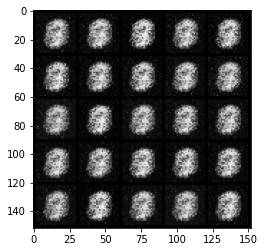

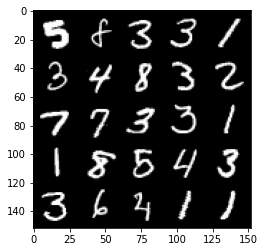

Epoch 2, step 1000: Generator loss: 1.8388242151737217, discriminator loss: 0.268314457505941


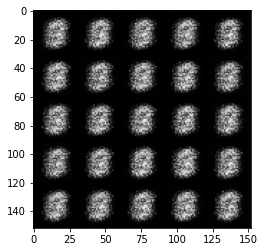

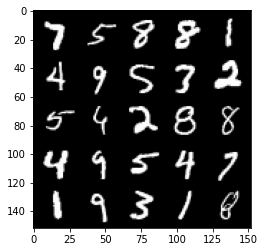

Epoch 3, step 1500: Generator loss: 2.188001608848569, discriminator loss: 0.14449680513143548


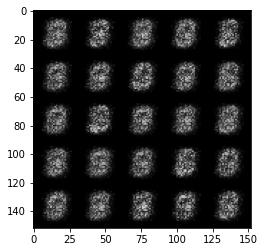

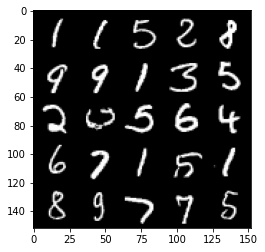

Epoch 4, step 2000: Generator loss: 1.8063746104240404, discriminator loss: 0.2061286652386189


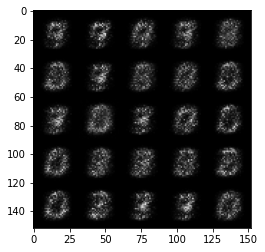

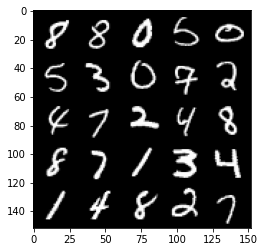

Epoch 5, step 2500: Generator loss: 1.6823912127017975, discriminator loss: 0.20900212118029587


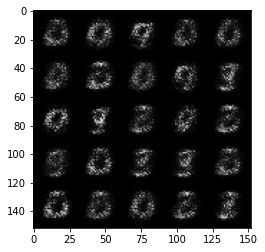

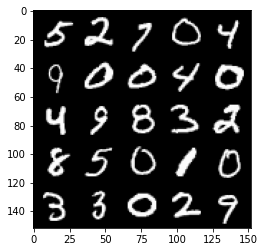

Epoch 6, step 3000: Generator loss: 1.9153455862998958, discriminator loss: 0.17155499434471103


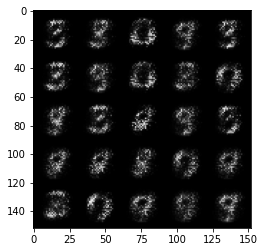

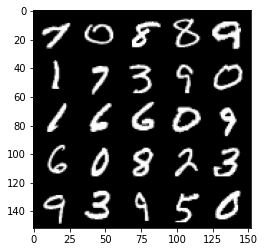

Epoch 7, step 3500: Generator loss: 2.3069638550281493, discriminator loss: 0.13661410589516162


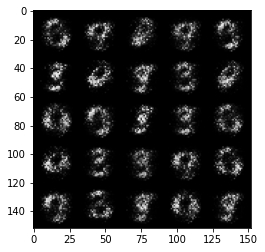

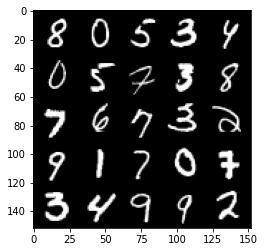

Epoch 8, step 4000: Generator loss: 2.724149122714996, discriminator loss: 0.1036807374656201


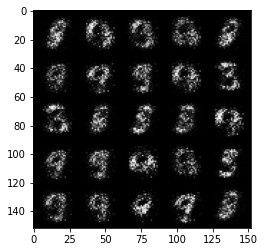

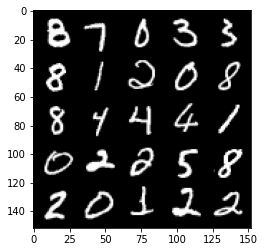

Epoch 9, step 4500: Generator loss: 3.146894588470455, discriminator loss: 0.08979498002678166


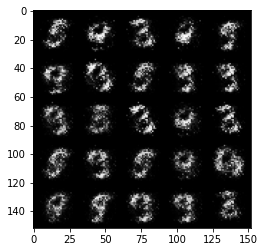

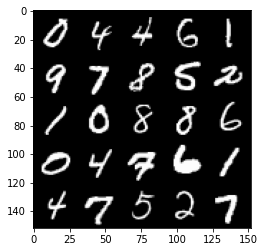

Epoch 10, step 5000: Generator loss: 3.2956983275413503, discriminator loss: 0.08191414470225569


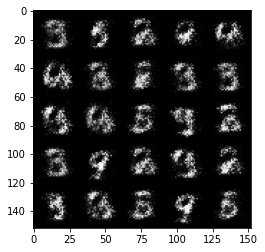

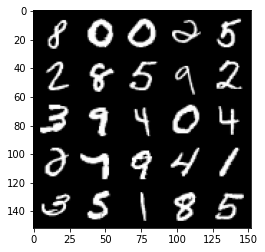

Epoch 11, step 5500: Generator loss: 3.656385458946229, discriminator loss: 0.06768488212674859


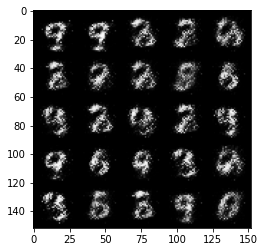

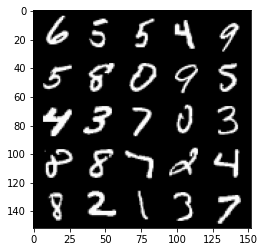

Epoch 12, step 6000: Generator loss: 3.884190645694734, discriminator loss: 0.06292856757342816


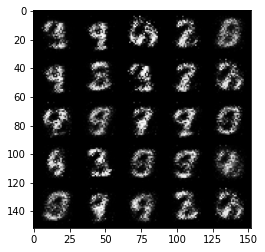

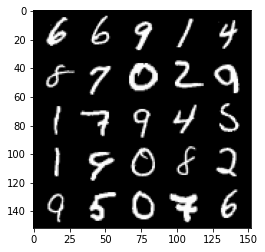

Epoch 13, step 6500: Generator loss: 3.946258893489838, discriminator loss: 0.06459871900081633


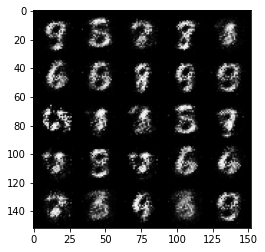

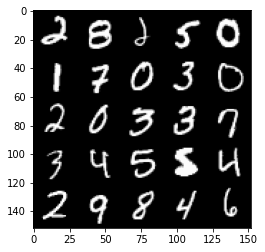

Epoch 14, step 7000: Generator loss: 3.87329323911667, discriminator loss: 0.06264071767032153


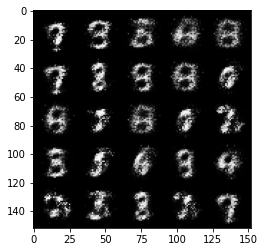

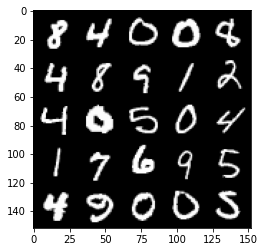

Epoch 15, step 7500: Generator loss: 3.8820023336410516, discriminator loss: 0.0579570811912417


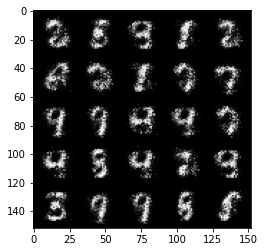

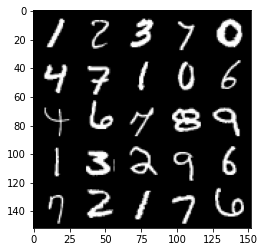

Epoch 17, step 8000: Generator loss: 3.94076332998276, discriminator loss: 0.055001347891986345


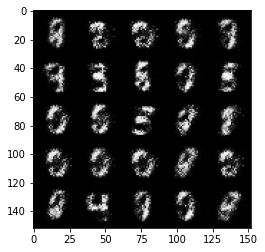

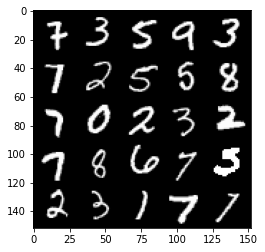

Epoch 18, step 8500: Generator loss: 4.008510244846347, discriminator loss: 0.061419270806014496


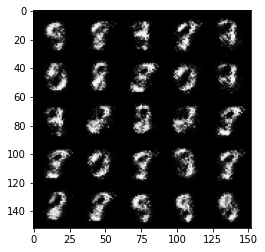

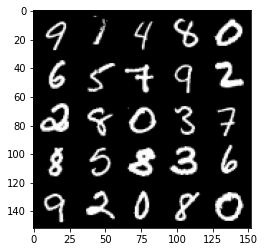

Epoch 19, step 9000: Generator loss: 4.0383818693161, discriminator loss: 0.05643372423201794


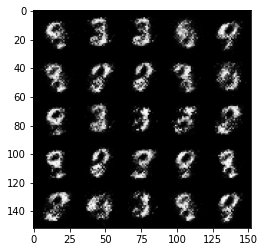

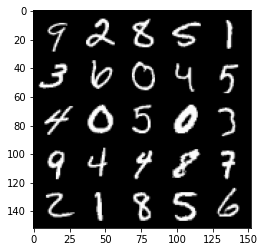

Epoch 20, step 9500: Generator loss: 4.063748060703275, discriminator loss: 0.053914527010172617


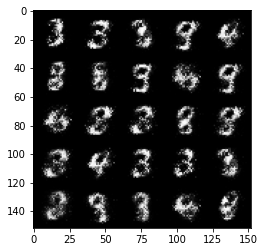

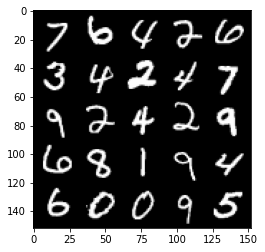

Epoch 21, step 10000: Generator loss: 4.214500878810884, discriminator loss: 0.058748317424207906


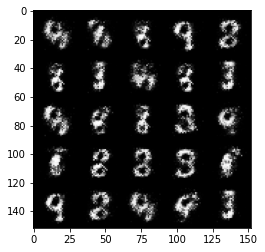

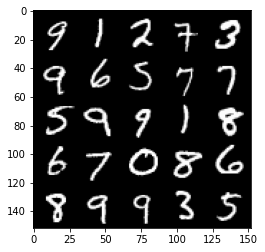

Epoch 22, step 10500: Generator loss: 4.094412629127502, discriminator loss: 0.06869521059468395


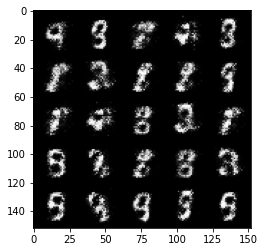

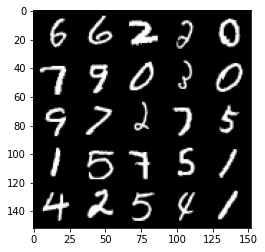

Epoch 23, step 11000: Generator loss: 4.18441215181351, discriminator loss: 0.06404391867667433


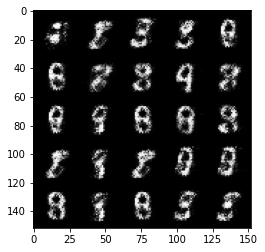

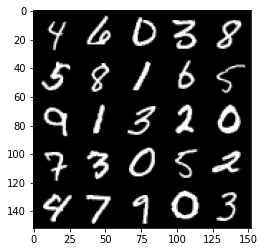

Epoch 24, step 11500: Generator loss: 3.9790797815322865, discriminator loss: 0.07922215021401642


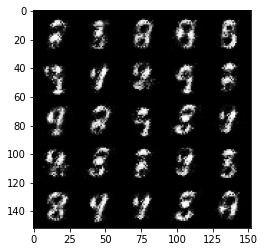

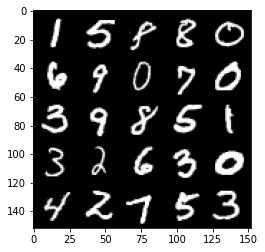

Epoch 25, step 12000: Generator loss: 4.187225247859956, discriminator loss: 0.06726998708397151


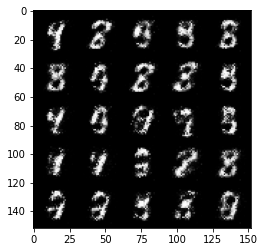

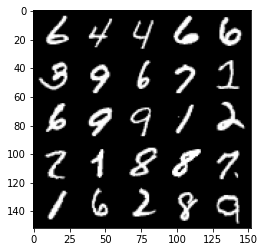

Epoch 26, step 12500: Generator loss: 4.20934237098694, discriminator loss: 0.06577466151863336


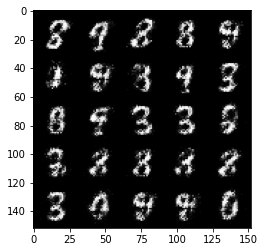

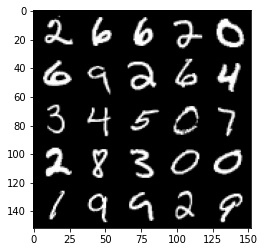

Epoch 27, step 13000: Generator loss: 4.117701622009279, discriminator loss: 0.08155622454732647


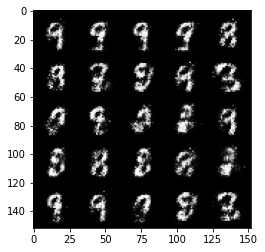

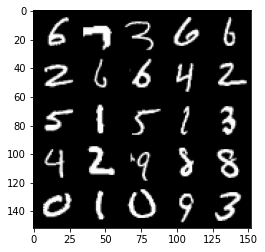

Epoch 28, step 13500: Generator loss: 4.080808892726899, discriminator loss: 0.08063063870370386


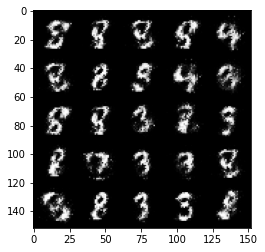

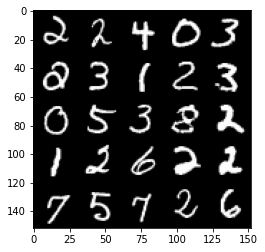

Epoch 29, step 14000: Generator loss: 4.054315169811247, discriminator loss: 0.0865428334772588


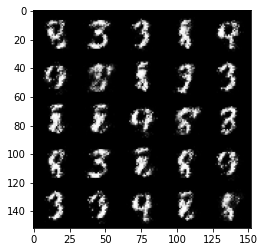

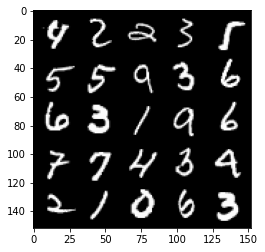

Epoch 30, step 14500: Generator loss: 3.7841760048866266, discriminator loss: 0.10117035585641862


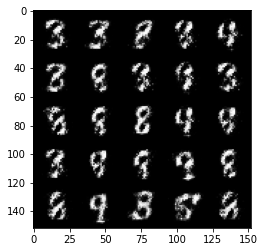

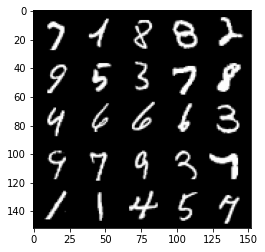

Epoch 31, step 15000: Generator loss: 3.857272627353667, discriminator loss: 0.09092517053335908


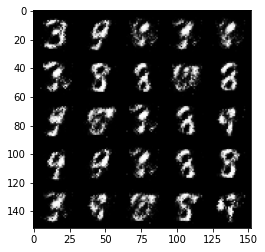

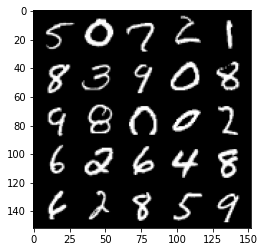

Epoch 33, step 15500: Generator loss: 4.056648348808292, discriminator loss: 0.08811255178600556


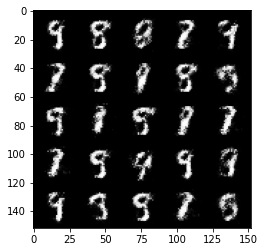

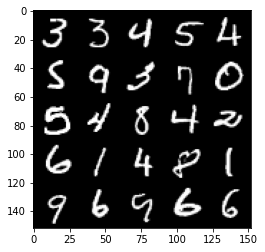

Epoch 34, step 16000: Generator loss: 3.787087561130523, discriminator loss: 0.10890693774074317


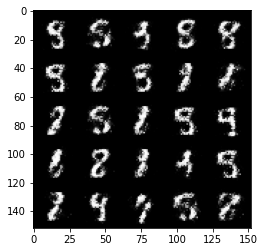

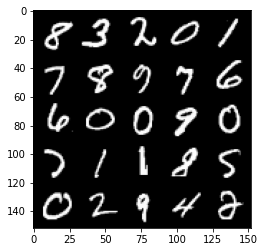

Epoch 35, step 16500: Generator loss: 3.819133922100066, discriminator loss: 0.10537625245749951


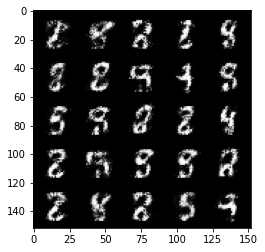

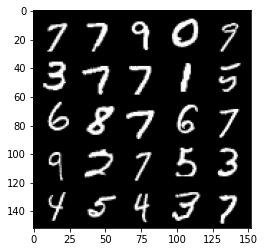

Epoch 36, step 17000: Generator loss: 3.6857915177345246, discriminator loss: 0.11520125010609636


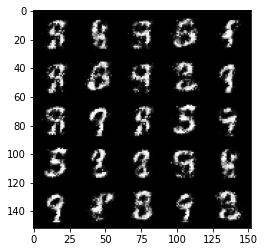

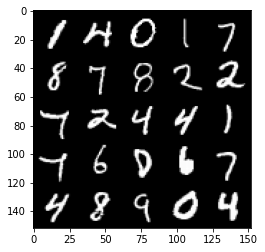

Epoch 37, step 17500: Generator loss: 3.541348771572115, discriminator loss: 0.12026556788384922


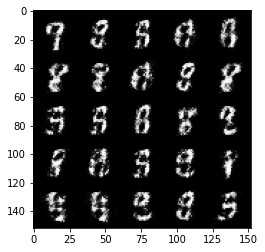

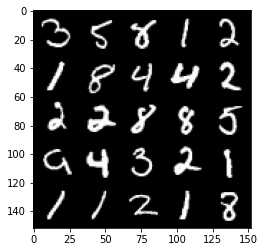

Epoch 38, step 18000: Generator loss: 3.6068905625343346, discriminator loss: 0.12089050298184156


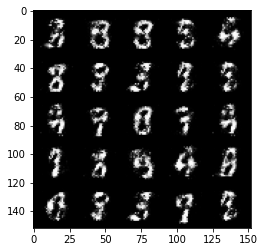

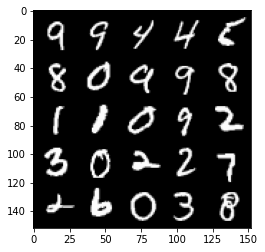

Epoch 39, step 18500: Generator loss: 3.6359104561805746, discriminator loss: 0.12272980775684118


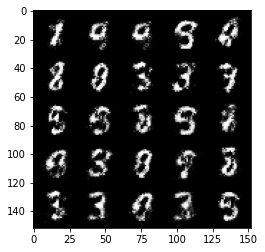

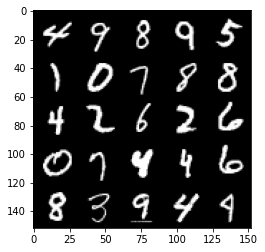

Epoch 40, step 19000: Generator loss: 3.5087408051490785, discriminator loss: 0.12978565157204866


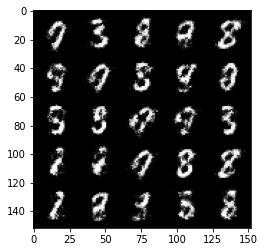

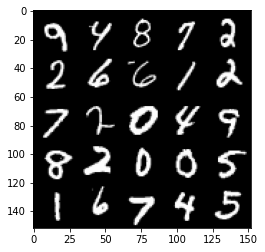

Epoch 41, step 19500: Generator loss: 3.464671164035795, discriminator loss: 0.1252441217303276


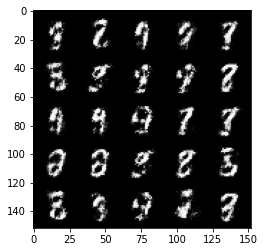

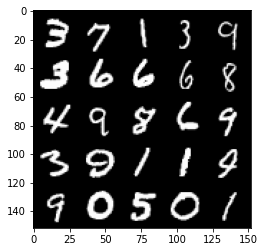

Epoch 42, step 20000: Generator loss: 3.4286871085166912, discriminator loss: 0.12637168145179756


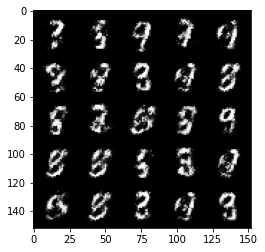

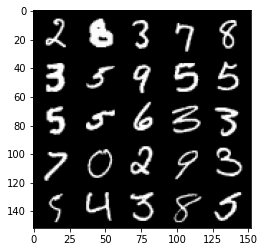

Epoch 43, step 20500: Generator loss: 3.3888255190849312, discriminator loss: 0.13911170966923234


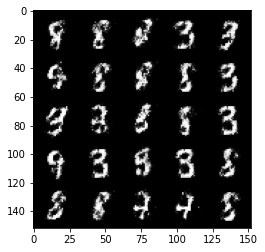

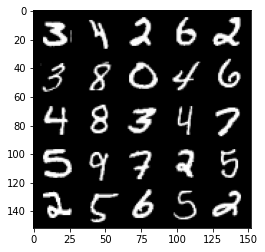

Epoch 44, step 21000: Generator loss: 3.3388316197395334, discriminator loss: 0.14430788297951216


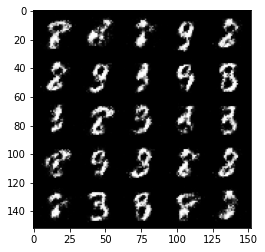

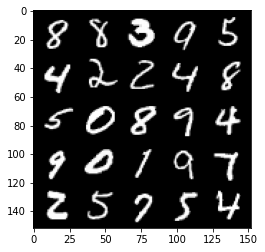

Epoch 45, step 21500: Generator loss: 3.244606861114503, discriminator loss: 0.14538533067703246


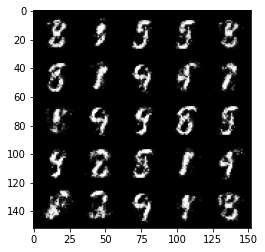

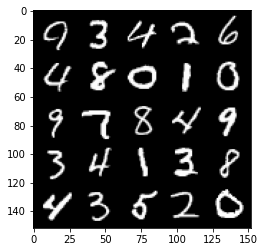

Epoch 46, step 22000: Generator loss: 3.175444802761076, discriminator loss: 0.15136726342141626


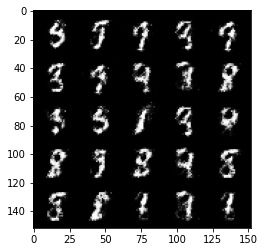

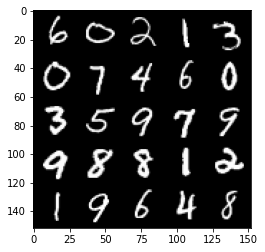

Epoch 47, step 22500: Generator loss: 3.26858854436874, discriminator loss: 0.1447945766597986


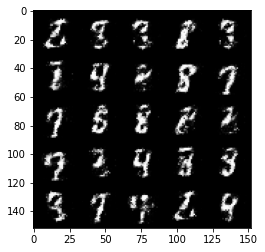

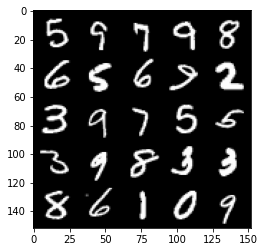

Epoch 49, step 23000: Generator loss: 3.2196324634552003, discriminator loss: 0.16335212920606132


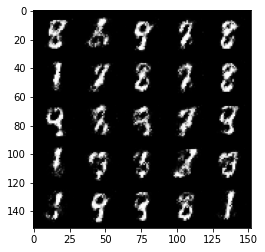

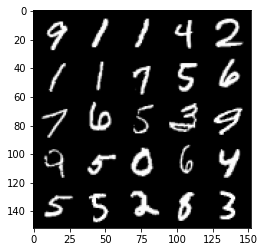

Epoch 50, step 23500: Generator loss: 2.951533985614777, discriminator loss: 0.17977865166962156


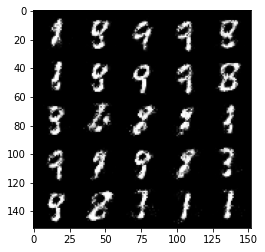

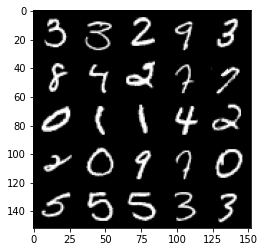

Epoch 51, step 24000: Generator loss: 3.001899676799773, discriminator loss: 0.1729957150965929


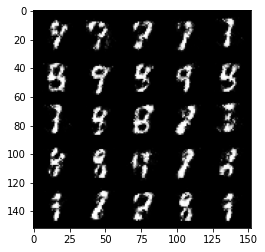

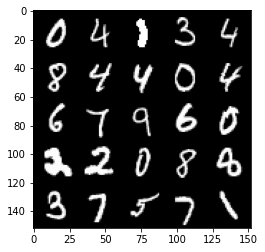

Epoch 52, step 24500: Generator loss: 2.9813169593811057, discriminator loss: 0.1627632771730423


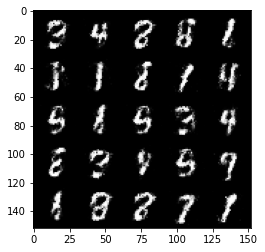

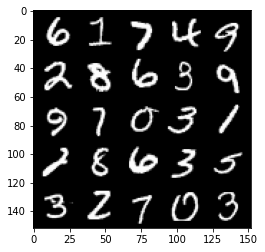

Epoch 53, step 25000: Generator loss: 2.980941544532775, discriminator loss: 0.178041340366006


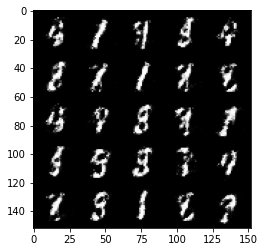

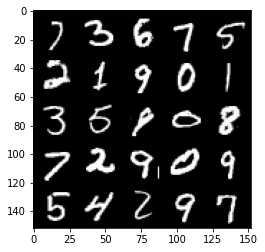

Epoch 54, step 25500: Generator loss: 2.9916336884498613, discriminator loss: 0.19130490705370903


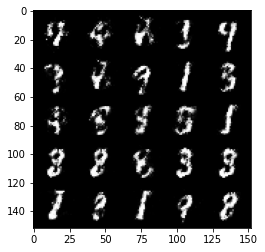

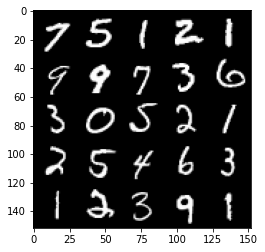

Epoch 55, step 26000: Generator loss: 2.9457760019302355, discriminator loss: 0.2000018650889397


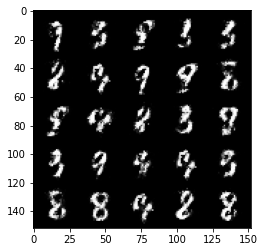

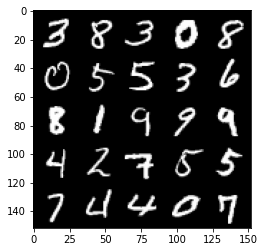

Epoch 56, step 26500: Generator loss: 3.0045836582183822, discriminator loss: 0.16753259865939624


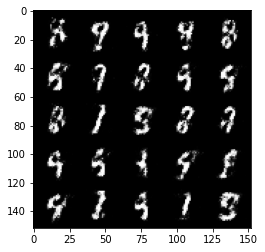

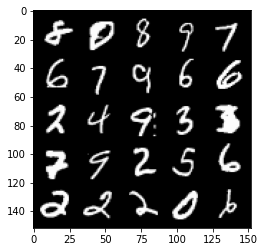

Epoch 57, step 27000: Generator loss: 3.0426981830596924, discriminator loss: 0.16865479874610903


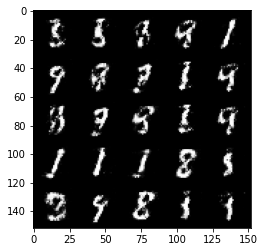

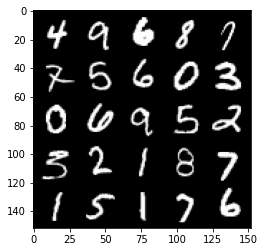

Epoch 58, step 27500: Generator loss: 2.919475630283354, discriminator loss: 0.19322680108249177


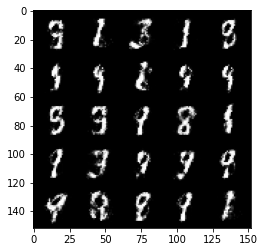

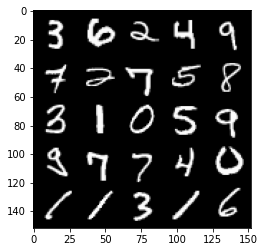

Epoch 59, step 28000: Generator loss: 2.696704508781431, discriminator loss: 0.2278142561018466


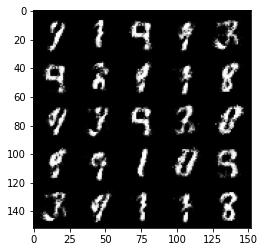

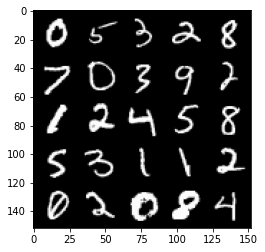

Epoch 60, step 28500: Generator loss: 2.607465457439422, discriminator loss: 0.21238178089261042


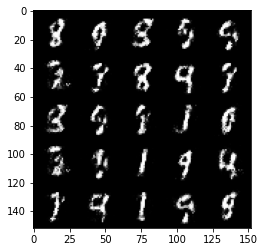

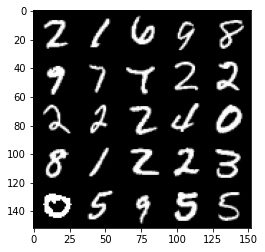

Epoch 61, step 29000: Generator loss: 2.6591581740379326, discriminator loss: 0.20948044696450227


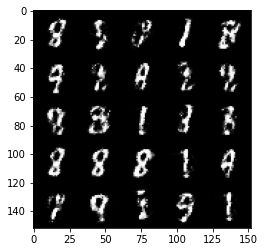

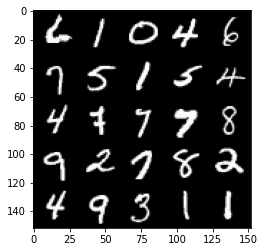

Epoch 62, step 29500: Generator loss: 2.6468386864662174, discriminator loss: 0.22032613536715534


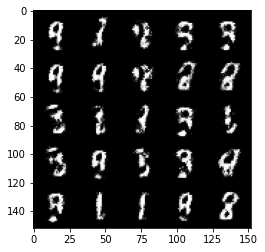

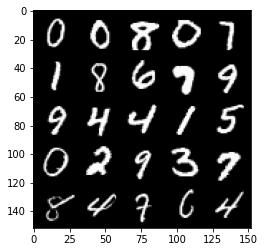

Epoch 63, step 30000: Generator loss: 2.6743158264160147, discriminator loss: 0.20780753329396262


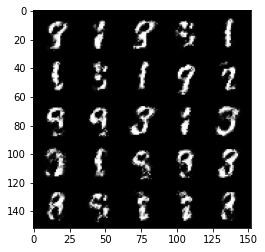

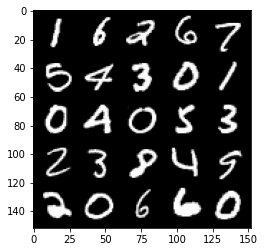

Epoch 65, step 30500: Generator loss: 2.5792031297683686, discriminator loss: 0.23967818921804437


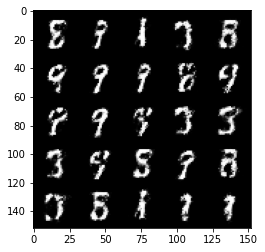

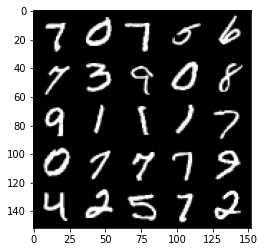

Epoch 66, step 31000: Generator loss: 2.4686386423110966, discriminator loss: 0.23733214437961556


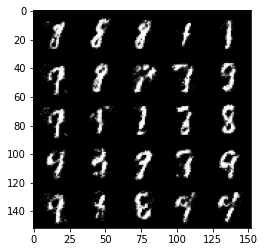

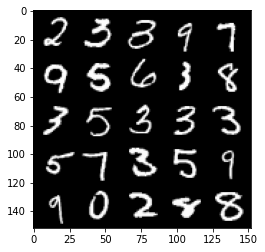

Epoch 67, step 31500: Generator loss: 2.4662742660045636, discriminator loss: 0.24355406898260104


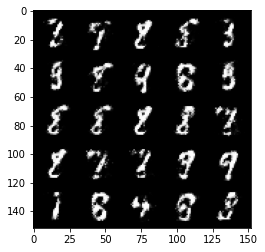

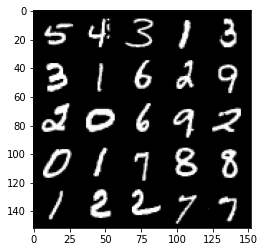

Epoch 68, step 32000: Generator loss: 2.4828756761550896, discriminator loss: 0.2266937681138514


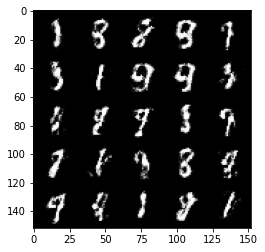

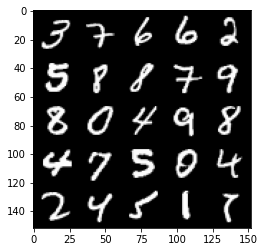

Epoch 69, step 32500: Generator loss: 2.5445443248748774, discriminator loss: 0.23274086323380463


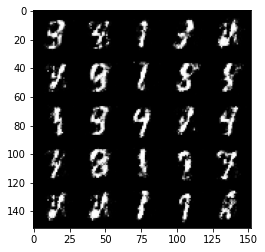

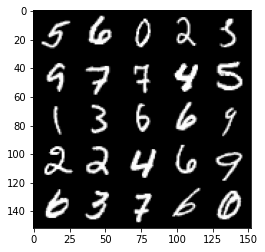

Epoch 70, step 33000: Generator loss: 2.259526320219039, discriminator loss: 0.2966443259716031


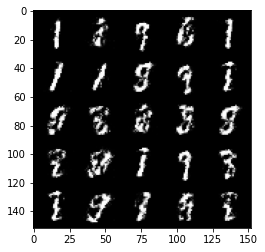

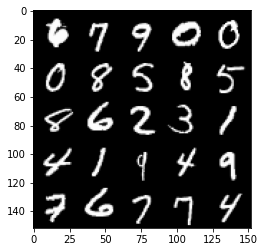

Epoch 71, step 33500: Generator loss: 2.253756183862685, discriminator loss: 0.2727582204043869


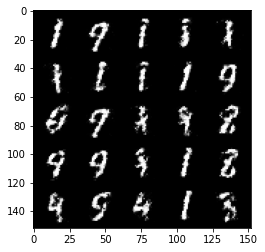

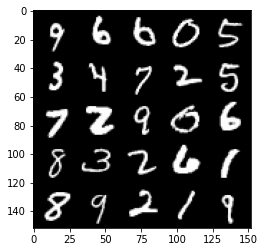

Epoch 72, step 34000: Generator loss: 2.31132616519928, discriminator loss: 0.2617194143533706


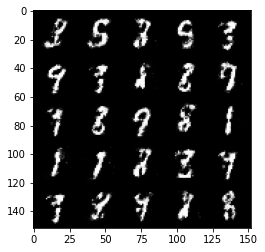

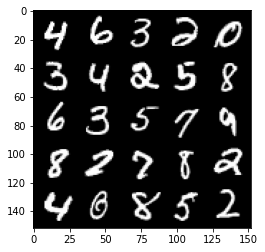

Epoch 73, step 34500: Generator loss: 2.345743257761003, discriminator loss: 0.26303193724155416


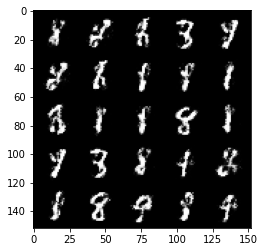

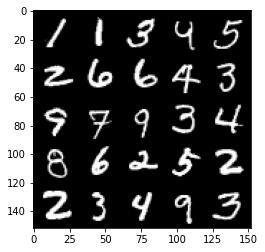

Epoch 74, step 35000: Generator loss: 2.312133801937102, discriminator loss: 0.26916903018951416


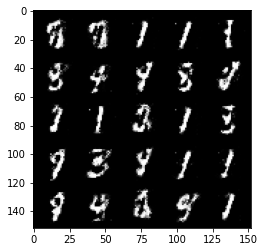

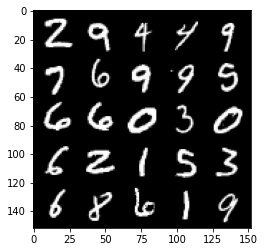

Epoch 75, step 35500: Generator loss: 2.375918913125992, discriminator loss: 0.25229138061404216


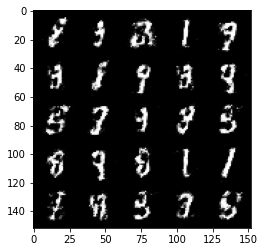

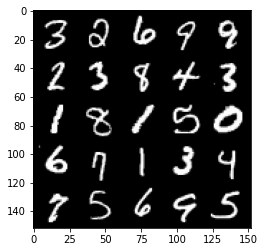

Epoch 76, step 36000: Generator loss: 2.4636208536624915, discriminator loss: 0.2464594085216522


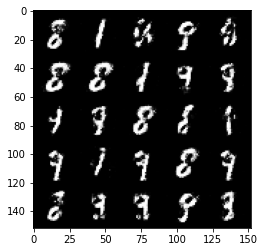

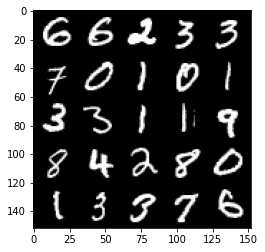

Epoch 77, step 36500: Generator loss: 2.3751995320320134, discriminator loss: 0.25453819939494154


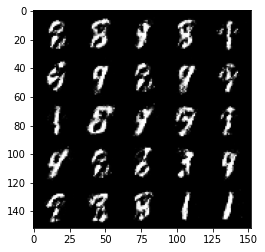

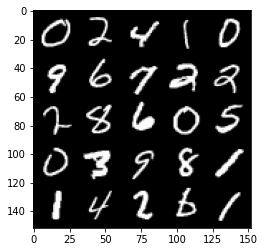

Epoch 78, step 37000: Generator loss: 2.290597687244416, discriminator loss: 0.27970439925789825


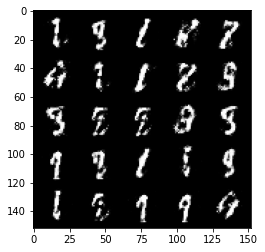

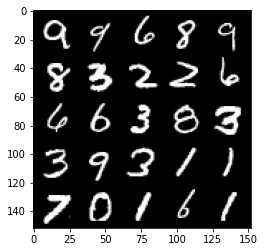

Epoch 79, step 37500: Generator loss: 2.266465975522997, discriminator loss: 0.2685635558962824


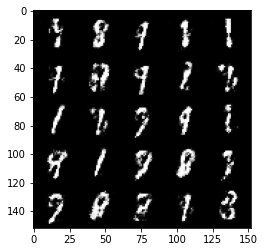

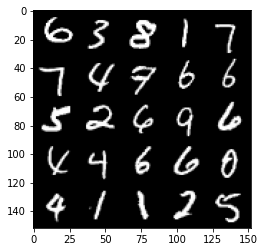

Epoch 81, step 38000: Generator loss: 2.1997040340900447, discriminator loss: 0.2912790668308733


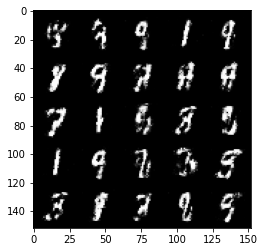

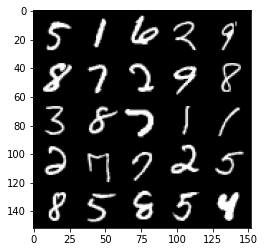

Epoch 82, step 38500: Generator loss: 2.190999847650529, discriminator loss: 0.2839214686155319


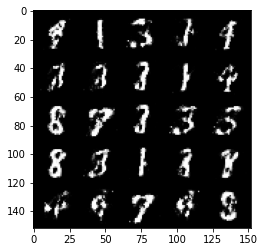

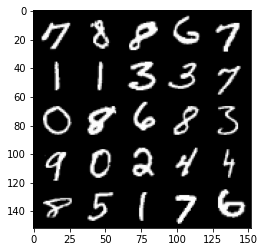

Epoch 83, step 39000: Generator loss: 2.184447455644609, discriminator loss: 0.2773780681788921


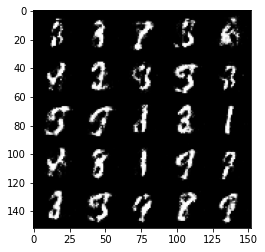

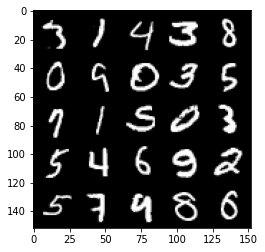

Epoch 84, step 39500: Generator loss: 2.0798802688121785, discriminator loss: 0.31391583317518224


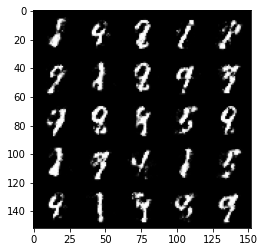

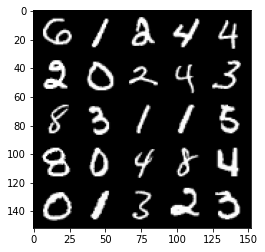

Epoch 85, step 40000: Generator loss: 2.0020326414108265, discriminator loss: 0.3151471272706985


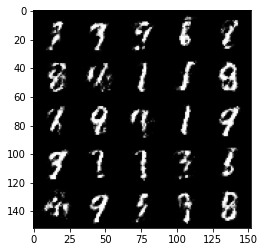

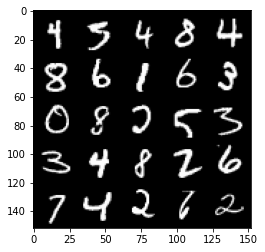

Epoch 86, step 40500: Generator loss: 1.9446095345020293, discriminator loss: 0.3270398724079129


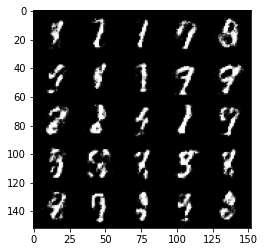

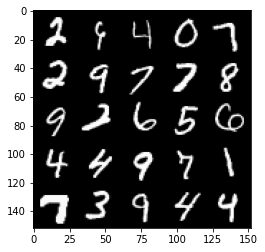

Epoch 87, step 41000: Generator loss: 2.0363437824249253, discriminator loss: 0.30899633064866044


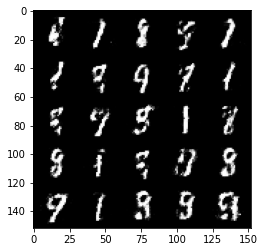

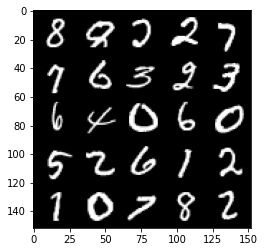

Epoch 88, step 41500: Generator loss: 1.9712315964698774, discriminator loss: 0.32278357604145996


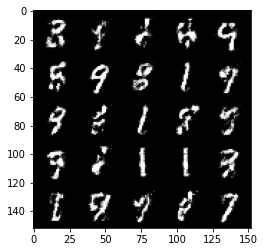

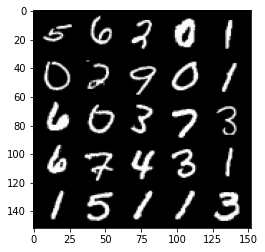

Epoch 89, step 42000: Generator loss: 1.926660562753675, discriminator loss: 0.336442025333643


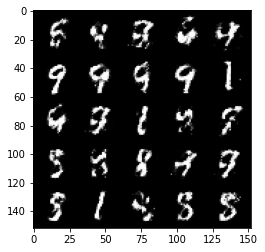

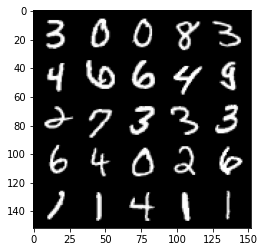

Epoch 90, step 42500: Generator loss: 1.873900979280473, discriminator loss: 0.33542655178904524


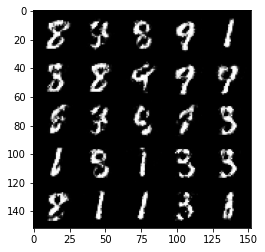

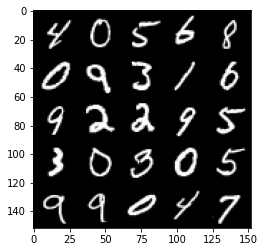

Epoch 91, step 43000: Generator loss: 1.929938543319702, discriminator loss: 0.3358442396223548


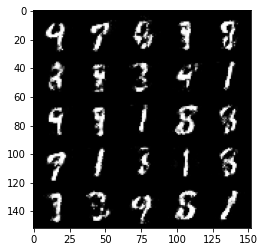

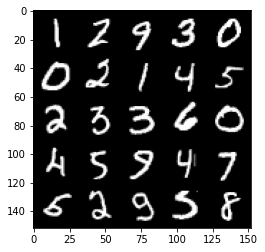

Epoch 92, step 43500: Generator loss: 1.7742795016765591, discriminator loss: 0.3702972248792649


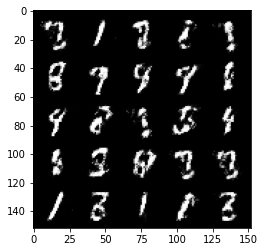

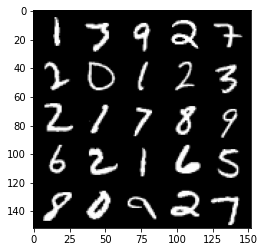

Epoch 93, step 44000: Generator loss: 1.7840690121650673, discriminator loss: 0.3692658081650733


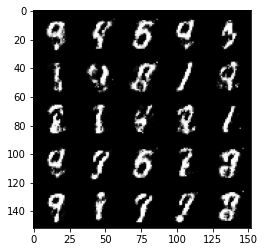

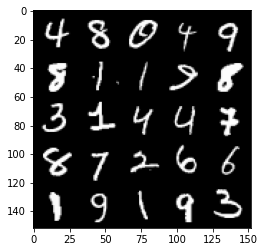

Epoch 94, step 44500: Generator loss: 1.8505678737163533, discriminator loss: 0.3298382892906669


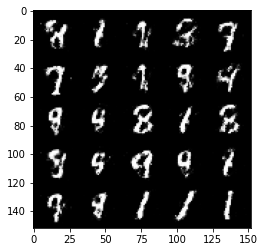

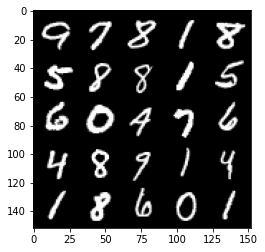

Epoch 95, step 45000: Generator loss: 1.9042664051055904, discriminator loss: 0.3321737501621246


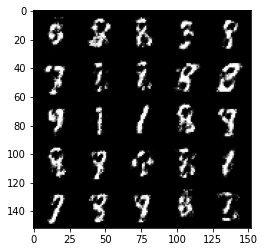

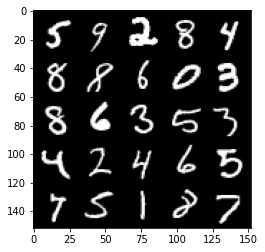

Epoch 97, step 45500: Generator loss: 1.734725579023359, discriminator loss: 0.3781496818065639


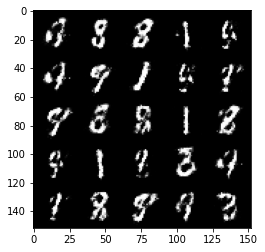

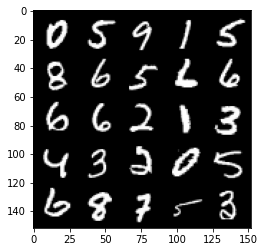

Epoch 98, step 46000: Generator loss: 1.793825213193893, discriminator loss: 0.34626516643166527


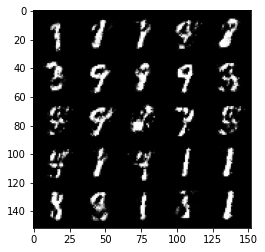

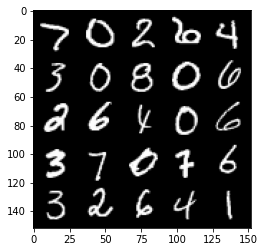

Epoch 99, step 46500: Generator loss: 1.9412352802753454, discriminator loss: 0.31021311306953425


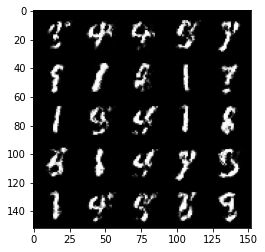

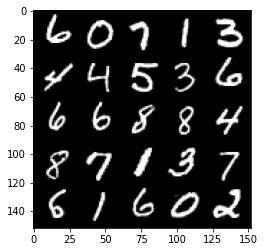

Epoch 100, step 47000: Generator loss: 1.812786835908889, discriminator loss: 0.3417606498301025


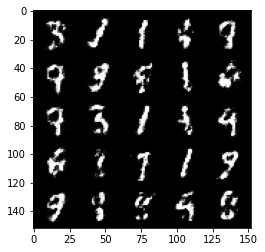

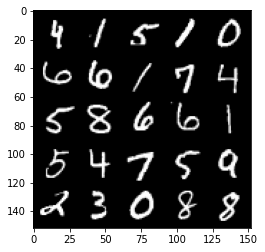

Epoch 101, step 47500: Generator loss: 1.76129809808731, discriminator loss: 0.35281068545579924


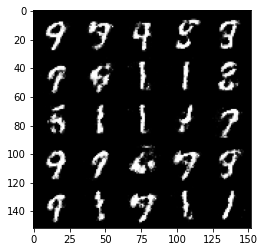

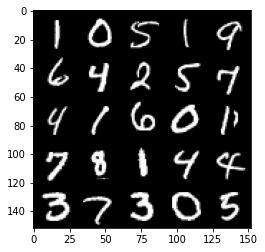

Epoch 102, step 48000: Generator loss: 1.7805298416614523, discriminator loss: 0.3508957631587981


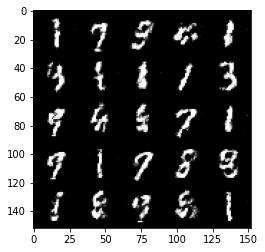

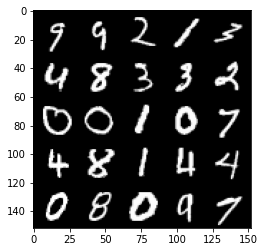

Epoch 103, step 48500: Generator loss: 1.7105579583644837, discriminator loss: 0.3666014084815981


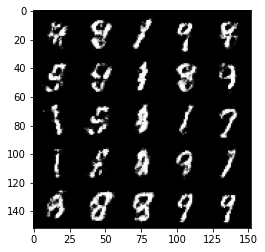

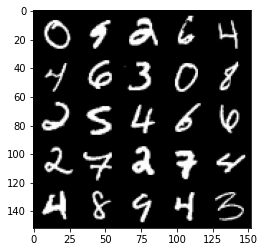

Epoch 104, step 49000: Generator loss: 1.7311995153427133, discriminator loss: 0.35980807572603246


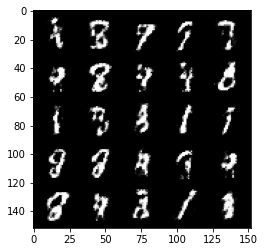

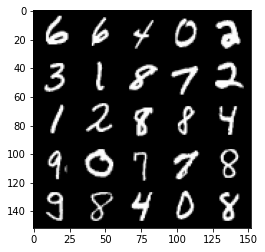

Epoch 105, step 49500: Generator loss: 1.7340963323116303, discriminator loss: 0.3644527840614318


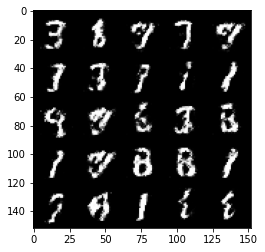

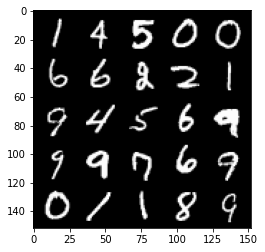

Epoch 106, step 50000: Generator loss: 1.6589538075923904, discriminator loss: 0.37889245456457143


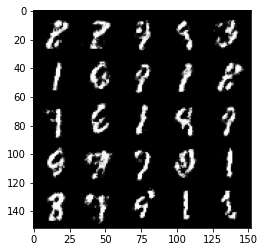

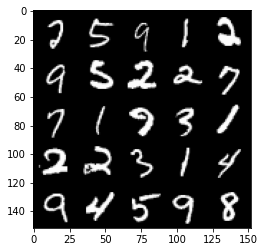

Epoch 107, step 50500: Generator loss: 1.6922547976970677, discriminator loss: 0.371441382586956


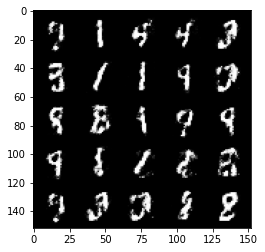

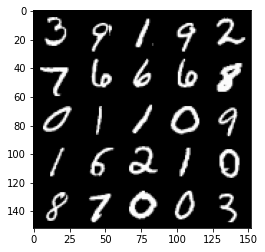

Epoch 108, step 51000: Generator loss: 1.6837578558921822, discriminator loss: 0.3640775365233421


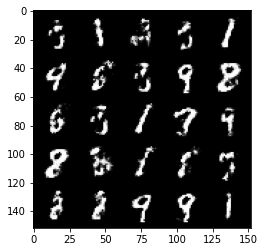

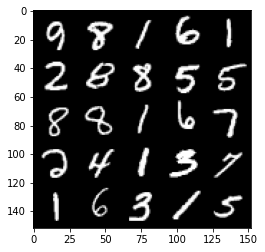

Epoch 109, step 51500: Generator loss: 1.7309265563488005, discriminator loss: 0.3644429281949998


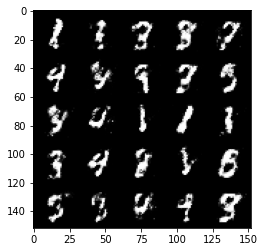

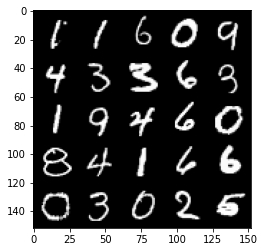

Epoch 110, step 52000: Generator loss: 1.7109359352588662, discriminator loss: 0.3689242507219316


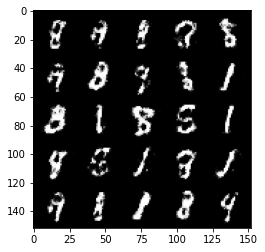

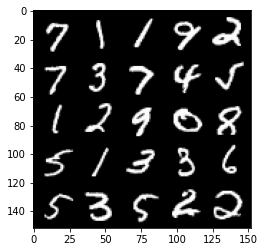

Epoch 111, step 52500: Generator loss: 1.6746802575588222, discriminator loss: 0.37932621693611146


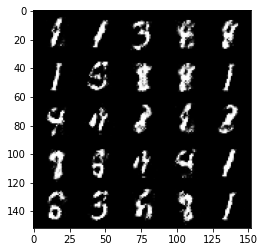

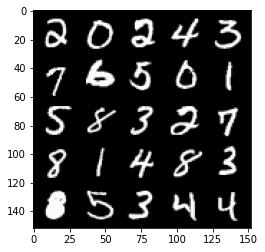

Epoch 113, step 53000: Generator loss: 1.6941965973377238, discriminator loss: 0.3664078437089923


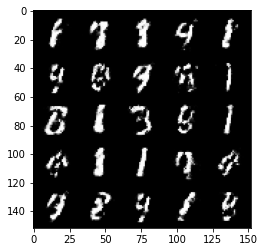

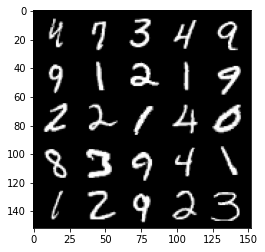

Epoch 114, step 53500: Generator loss: 1.6752216670513147, discriminator loss: 0.3660960248708727


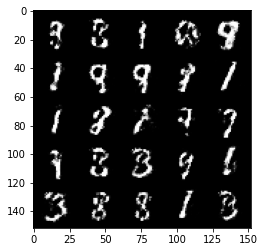

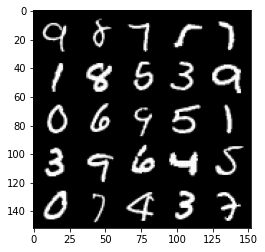

Epoch 115, step 54000: Generator loss: 1.5827905759811387, discriminator loss: 0.3956664281487462


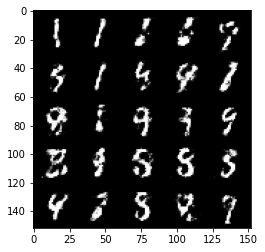

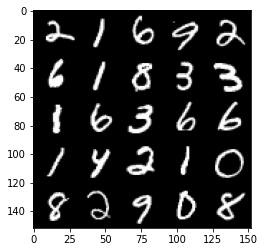

Epoch 116, step 54500: Generator loss: 1.6613923034667963, discriminator loss: 0.3685771110653879


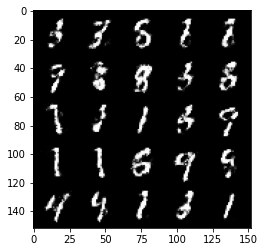

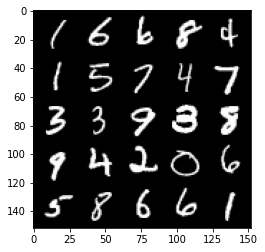

Epoch 117, step 55000: Generator loss: 1.6719823906421665, discriminator loss: 0.3754186421036723


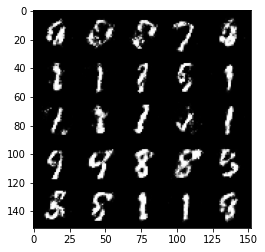

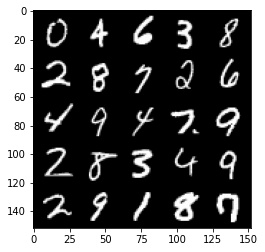

Epoch 118, step 55500: Generator loss: 1.5978294415473946, discriminator loss: 0.38161634421348617


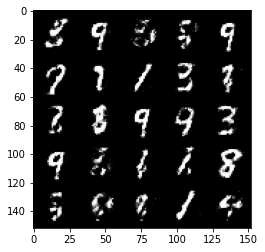

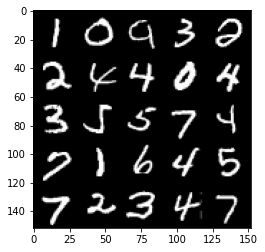

Epoch 119, step 56000: Generator loss: 1.5669629375934615, discriminator loss: 0.3874771601557729


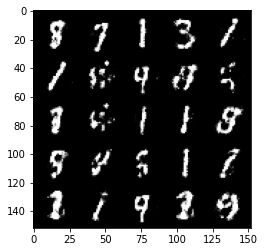

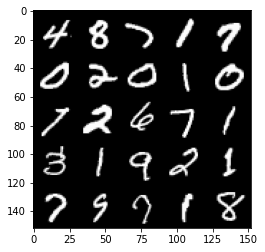

Epoch 120, step 56500: Generator loss: 1.6478624176979066, discriminator loss: 0.37359376633167246


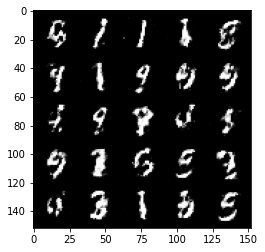

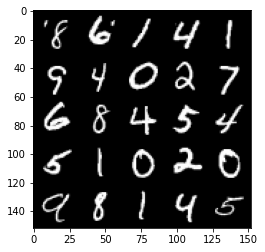

Epoch 121, step 57000: Generator loss: 1.5907434484958658, discriminator loss: 0.39815113186836204


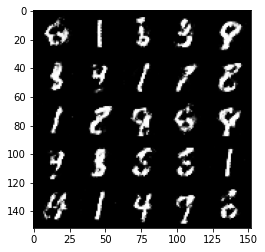

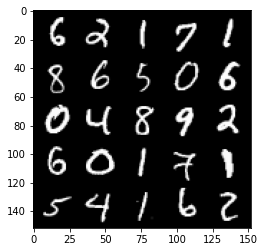

Epoch 122, step 57500: Generator loss: 1.4849589185714733, discriminator loss: 0.42975655710697164


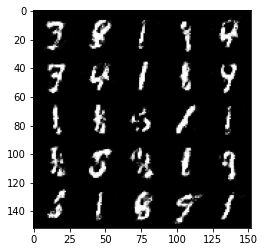

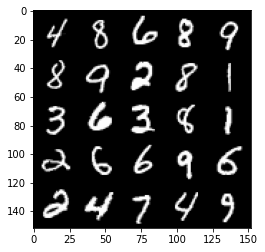

Epoch 123, step 58000: Generator loss: 1.4316879274845118, discriminator loss: 0.4405618038177493


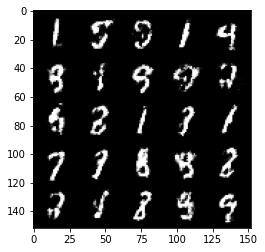

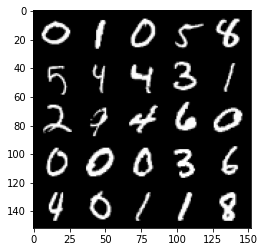

Epoch 124, step 58500: Generator loss: 1.3706370084285737, discriminator loss: 0.45468624943494823


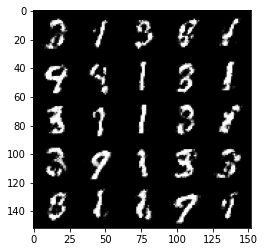

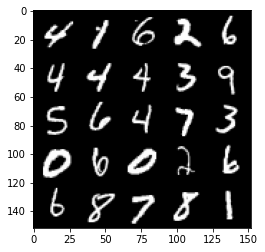

Epoch 125, step 59000: Generator loss: 1.4109933388233193, discriminator loss: 0.44134767234325367


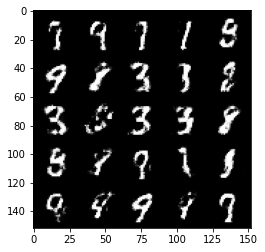

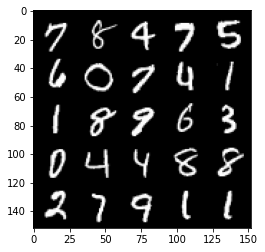

Epoch 126, step 59500: Generator loss: 1.393921822786331, discriminator loss: 0.4465381186604504


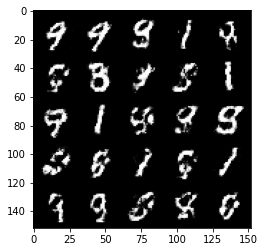

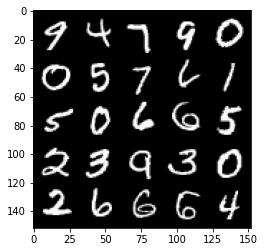

Epoch 127, step 60000: Generator loss: 1.4613741741180437, discriminator loss: 0.42942980611324305


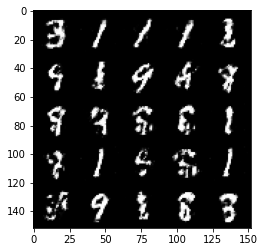

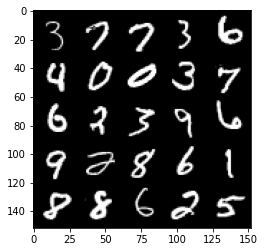

Epoch 128, step 60500: Generator loss: 1.446671616554261, discriminator loss: 0.4294250612258912


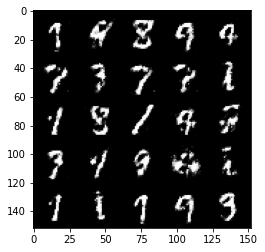

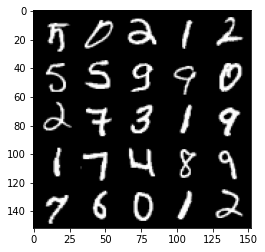

Epoch 130, step 61000: Generator loss: 1.4244868330955507, discriminator loss: 0.431970356285572


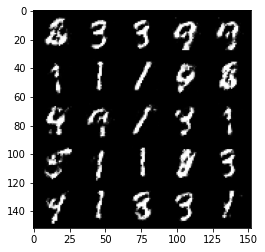

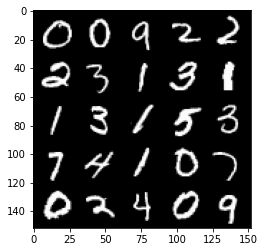

Epoch 131, step 61500: Generator loss: 1.42313399529457, discriminator loss: 0.4321058509945869


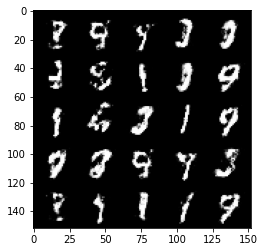

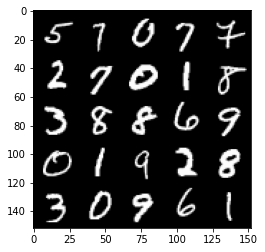

Epoch 132, step 62000: Generator loss: 1.3603446290493013, discriminator loss: 0.4580891556739805


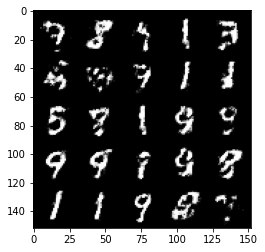

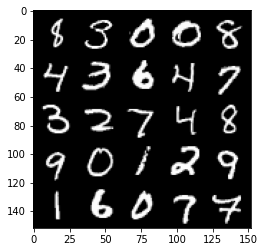

Epoch 133, step 62500: Generator loss: 1.3060682561397547, discriminator loss: 0.4705386469960215


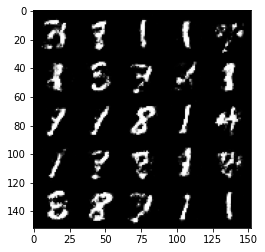

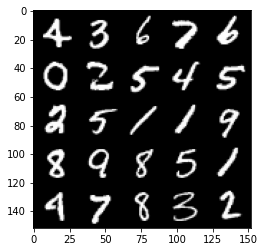

Epoch 134, step 63000: Generator loss: 1.258452483415604, discriminator loss: 0.485542748093605


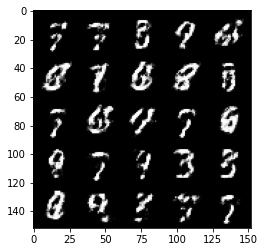

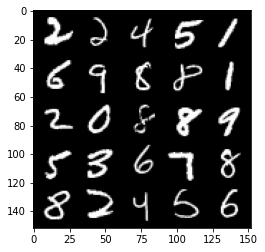

In [ ]:
# UNQ_C8 (UNIQUE CELL IDENTIFIER, DO NOT EDIT)
# GRADED FUNCTION: 

cur_step = 0
mean_generator_loss = 0
mean_discriminator_loss = 0
test_generator = True # Whether the generator should be tested
gen_loss = False
error = False
for epoch in range(n_epochs):
  
    # Dataloader returns the batches
    for real, _ in tqdm(dataloader):
        cur_batch_size = len(real)

        # Flatten the batch of real images from the dataset
        real = real.view(cur_batch_size, -1).to(device)

        ### Update discriminator ###
        # Zero out the gradients before backpropagation
        disc_opt.zero_grad()

        # Calculate discriminator loss
        disc_loss = get_disc_loss(gen, disc, criterion, real, cur_batch_size, z_dim, device)

        # Update gradients
        disc_loss.backward(retain_graph=True)

        # Update optimizer
        disc_opt.step()

        # For testing purposes, to keep track of the generator weights
        if test_generator:
            old_generator_weights = gen.gen[0][0].weight.detach().clone()

        ### Update generator ###
        #     Hint: This code will look a lot like the discriminator updates!
        #     These are the steps you will need to complete:
        #       1) Zero out the gradients.
        #       2) Calculate the generator loss, assigning it to gen_loss.
        #       3) Backprop through the generator: update the gradients and optimizer.
        #### START CODE HERE ####
        gen_opt.zero_grad()
        gen_loss = get_gen_loss(gen, disc, criterion, cur_batch_size, z_dim, device)
        gen_loss.backward()
        gen_opt.step()
        #### END CODE HERE ####

        # For testing purposes, to check that your code changes the generator weights
        if test_generator:
            try:
                assert lr > 0.0000002 or (gen.gen[0][0].weight.grad.abs().max() < 0.0005 and epoch == 0)
                assert torch.any(gen.gen[0][0].weight.detach().clone() != old_generator_weights)
            except:
                error = True
                print("Runtime tests have failed")

        # Keep track of the average discriminator loss
        mean_discriminator_loss += disc_loss.item() / display_step

        # Keep track of the average generator loss
        mean_generator_loss += gen_loss.item() / display_step

        ### Visualization code ###
        if cur_step % display_step == 0 and cur_step > 0:
            print(f"Epoch {epoch}, step {cur_step}: Generator loss: {mean_generator_loss}, discriminator loss: {mean_discriminator_loss}")
            fake_noise = get_noise(cur_batch_size, z_dim, device=device)
            fake = gen(fake_noise)
            show_tensor_images(fake)
            show_tensor_images(real)
            mean_generator_loss = 0
            mean_discriminator_loss = 0
        cur_step += 1
